Useful Notebook for Deformable DETR: https://github.com/NielsRogge/Transformers-Tutorials/blob/master/Deformable-DETR/Inference_with_Deformable_DETR_(CPU).ipynb

- OWOD Weights are weaker than OWDETR Weights for detection model

### Imports

In [1]:
import os
import glob
import sys
sys.path.append('OW-DETR')

In [2]:
from models.backbone import build_backbone
from models.deformable_transformer import build_deforamble_transformer
from models.deformable_detr import build
from util.misc import NestedTensor

In [3]:
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
import requests
import numpy as np

from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cuda


In [4]:
from object_detection_utils import (
    COLORS,
    preprocess, 
    box_cxcywh_to_xyxy, 
    rescale_bboxes,
    batch_detect,
    detect, 
    plot_results,
    plot_batch_detections,
    plot_batch_detections,
    plot_results_avenue,
    load_images_from_folder,
    list_image_files,
    save_cropped_images,
)

In [5]:
transform = T.Compose([
    T.Resize((500, 500)),  # Assuming 800 is the input size for the model
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

## Load OW-DETR
t2 ft seems to be the best, all rounded. t4 has the ability to detect some extra classes, but cannot detect the base ones

In [39]:
checkpoint = torch.load("./pretrained/owdetr_t1.pth", map_location=device)
print(checkpoint['args'])

Namespace(lr=0.0002, lr_backbone_names=['backbone.0'], lr_backbone=2e-05, lr_linear_proj_names=['reference_points', 'sampling_offsets'], lr_linear_proj_mult=0.1, batch_size=2, weight_decay=0.0001, epochs=45, lr_drop=40, lr_drop_epochs=None, clip_max_norm=0.1, sgd=False, with_box_refine=False, two_stage=False, frozen_weights=None, dilation=False, position_embedding='sine', position_embedding_scale=6.283185307179586, num_feature_levels=4, enc_layers=6, dec_layers=6, dim_feedforward=1024, hidden_dim=256, dropout=0.1, nheads=8, num_queries=100, dec_n_points=4, enc_n_points=4, masks=False, aux_loss=True, set_cost_class=2, set_cost_bbox=5, set_cost_giou=2, mask_loss_coef=1, dice_loss_coef=1, cls_loss_coef=2, bbox_loss_coef=5, giou_loss_coef=2, focal_alpha=0.25, coco_panoptic_path=None, remove_difficult=False, output_dir='exps/OWOD_t1_new_split', device='cuda', seed=42, resume='', start_epoch=0, eval=False, viz=False, eval_every=5, num_workers=2, cache_mode=False, PREV_INTRODUCED_CLS=0, CUR_I

In [40]:
backbone_path = './pretrained/dino_resnet50_pretrain.pth'
model, criterion, postprocessors = build(checkpoint['args'], backbone_path)
model.eval()
model = model.to(device)

81
DINO resnet50
Invalid class rangw: [19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]


In [41]:
print(checkpoint.keys())
msg = model.load_state_dict(checkpoint['model'], strict=False)
print(msg)

dict_keys(['model', 'optimizer', 'lr_scheduler', 'epoch', 'args'])
<All keys matched successfully>


## Run Example Object Detection Flow on single Image

In [42]:
image_tensor, image = preprocess("./assets/demo7.jpg", transform=transform)

In [63]:
scores, boxes = detect(image_tensor, model, im_size=image.size, threshold=0.3)

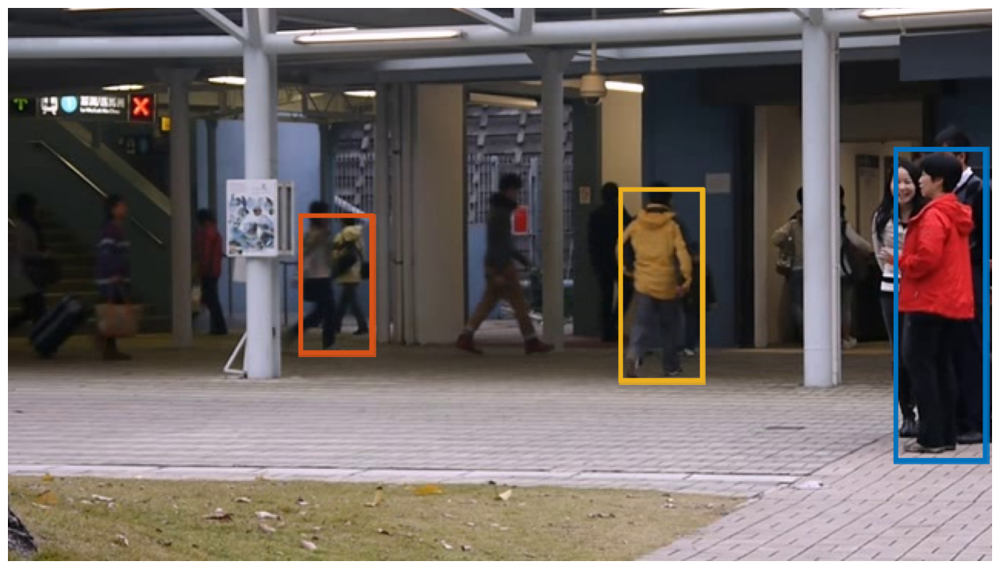

In [64]:
plot_results(image, scores, boxes)

## Run Object Detection on batch of images

In [45]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as T
from util.misc import nested_tensor_from_tensor_list

class CustomDataset(Dataset):
    def __init__(self, directory, transform=None, file_types=['*.jpg', '*.jpeg', '*.png']):
        self.image_paths = list_image_files(directory, file_types)
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image

def custom_collate(batch):
    # Collate function modified to create NestedTensor required by Deformable DETR
    # Assuming that each item in batch is just an image tensor
    nested_tensor = nested_tensor_from_tensor_list(batch)
    return nested_tensor

In [46]:
transform = T.Compose([
    T.Resize((500, 500)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
assets_path = "./assets/"
dataset = CustomDataset(assets_path, transform=transform)
# When creating the DataLoader
data_loader = DataLoader(dataset, batch_size=8, shuffle=False, collate_fn=custom_collate)

In [55]:
%%time
for nested_tensor in data_loader:
    detections = batch_detect(nested_tensor, model, device, object_keep_probab=0.3)

CPU times: user 858 ms, sys: 20 ms, total: 878 ms
Wall time: 751 ms


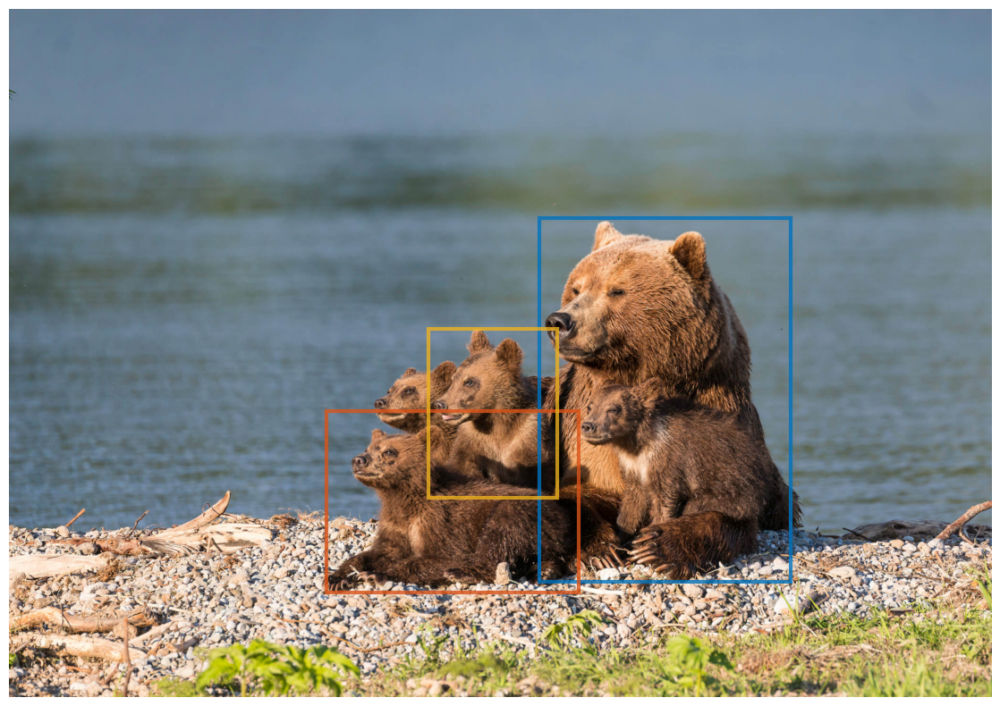

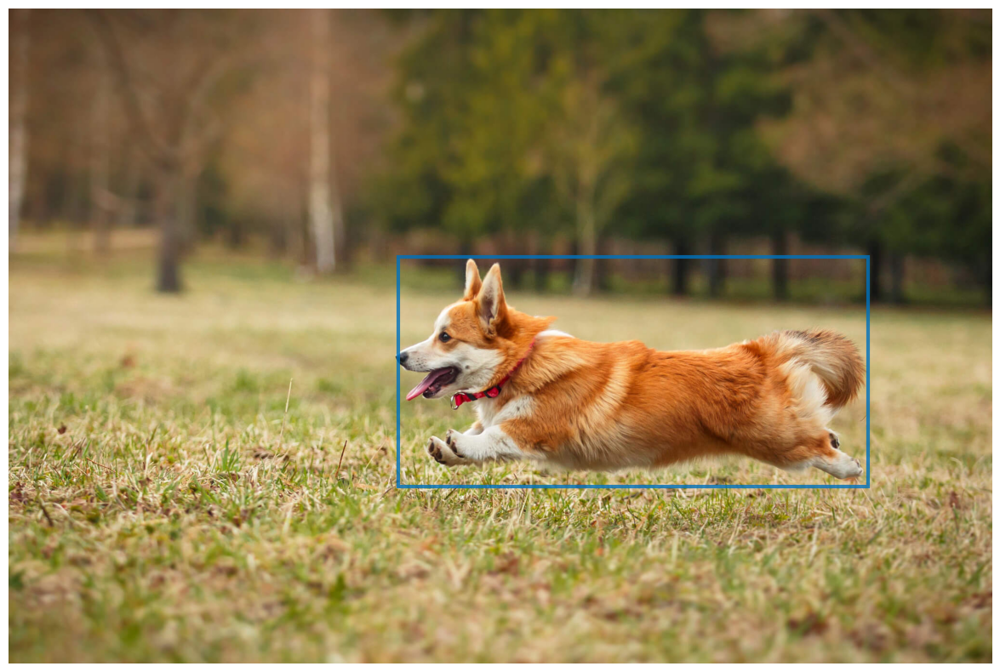

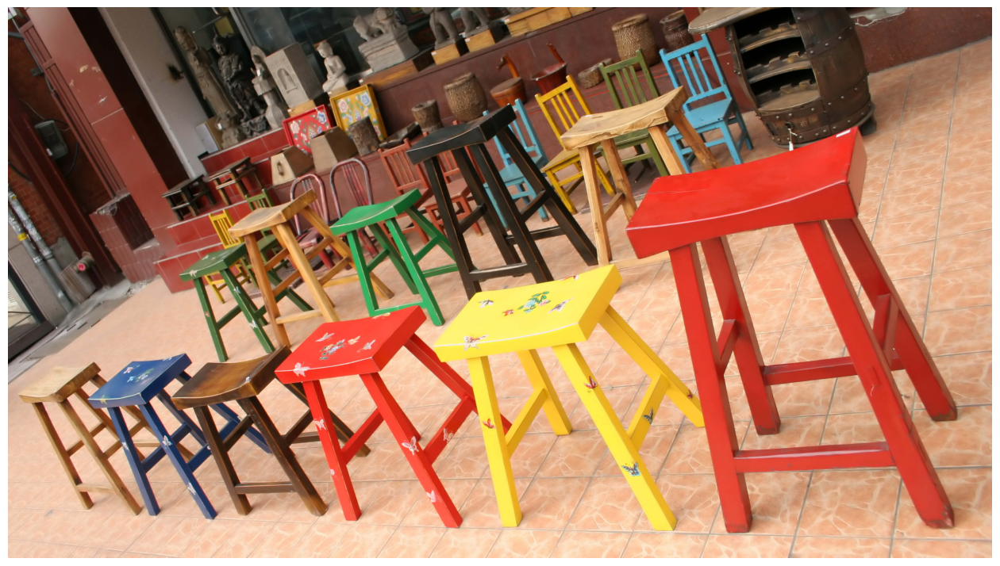

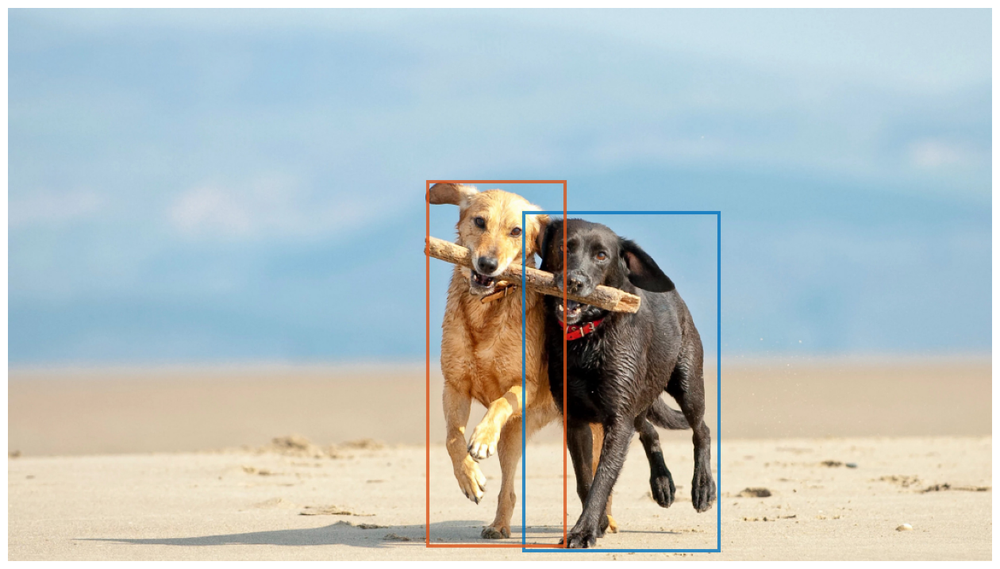

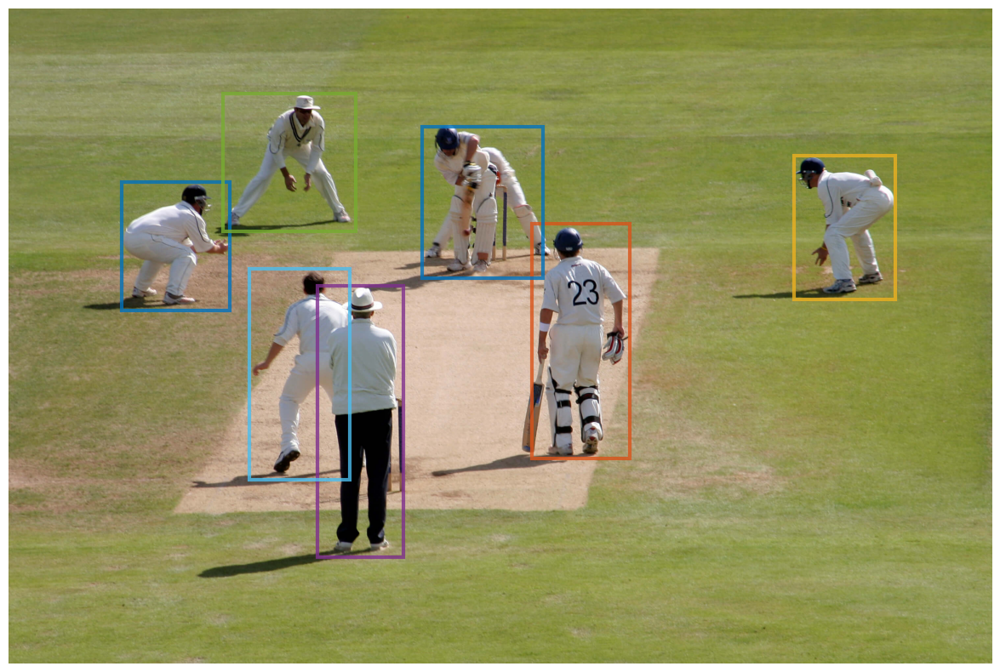

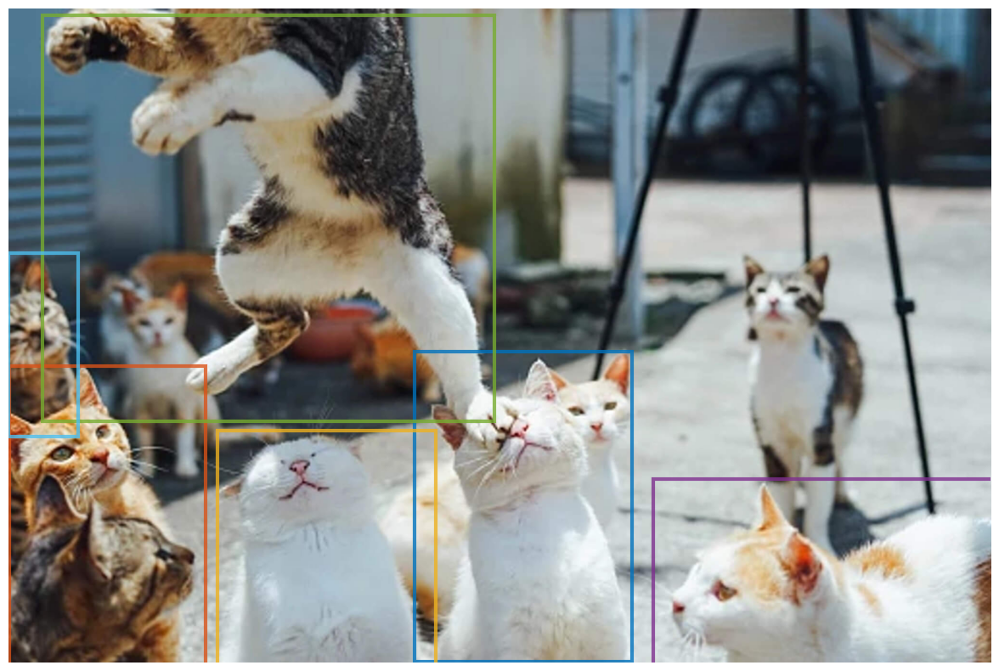

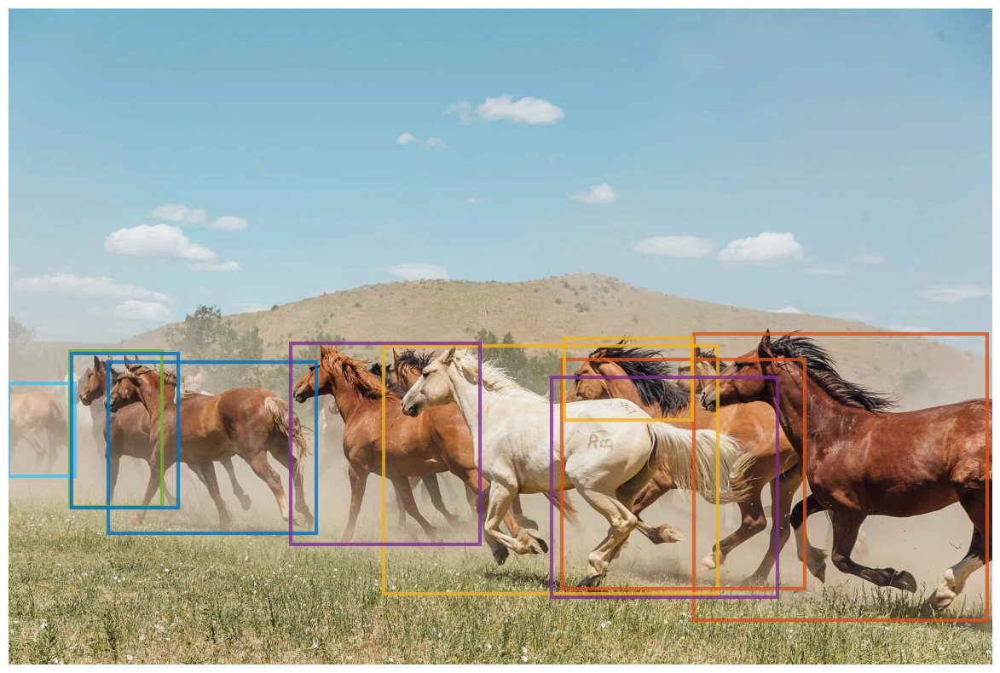

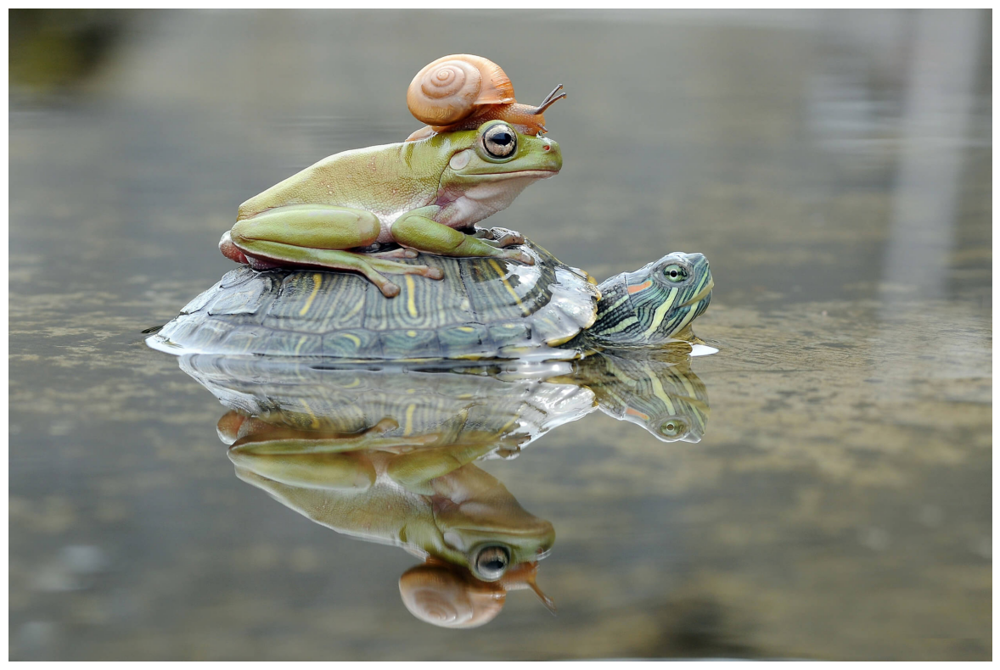

In [56]:
# Let's assume `detections` is the output from `batch_detect` function for a batch
# and `pil_images` is a list of PIL Image objects corresponding to that batch.
pil_images = load_images_from_folder(assets_path)
plot_batch_detections(pil_images, detections)

## Object Detection for CUHK Avenue

### File Display

In [6]:
train_dir = "./datasets/Avenue Dataset/train__/"
train_video_dirs = ["01", "02", "03", "04", "05", "06", "07", "08", "09", "10", "11", "12", "13", "14", "15", "16"]
train_video_paths = []
total_frames = 0
for dir in train_video_dirs:
    cur_dir = os.path.join(train_dir, dir)
    train_video_paths.append(cur_dir)
    jpg_files = [f for f in os.listdir(cur_dir) if f.endswith('.jpg')]
    total_frames += len(jpg_files)
    print(cur_dir, len(jpg_files))
print(f"Total Frames: {total_frames}")

./datasets/Avenue Dataset/train__/01 1364
./datasets/Avenue Dataset/train__/02 1511
./datasets/Avenue Dataset/train__/03 1487
./datasets/Avenue Dataset/train__/04 1511
./datasets/Avenue Dataset/train__/05 815
./datasets/Avenue Dataset/train__/06 1511
./datasets/Avenue Dataset/train__/07 1099
./datasets/Avenue Dataset/train__/08 1017
./datasets/Avenue Dataset/train__/09 1391
./datasets/Avenue Dataset/train__/10 1223
./datasets/Avenue Dataset/train__/11 781
./datasets/Avenue Dataset/train__/12 145
./datasets/Avenue Dataset/train__/13 366
./datasets/Avenue Dataset/train__/14 510
./datasets/Avenue Dataset/train__/15 353
./datasets/Avenue Dataset/train__/16 244
Total Frames: 15328


In [7]:
test_dir = "./datasets/Avenue Dataset/test__/"
test_video_dirs = ["01", "02", "03", "04", "05", "06", "07", "08", "09", "10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20", "21"]
test_video_paths = []
total_frames = 0
for dir in test_video_dirs:
    cur_dir = os.path.join(test_dir, dir)
    test_video_paths.append(cur_dir)
    jpg_files = [f for f in os.listdir(cur_dir) if f.endswith('.jpg')]
    total_frames += len(jpg_files)
    print(cur_dir, len(jpg_files))
print(f"Total Frames: {total_frames}")

./datasets/Avenue Dataset/test__/01 1439
./datasets/Avenue Dataset/test__/02 1211
./datasets/Avenue Dataset/test__/03 923
./datasets/Avenue Dataset/test__/04 947
./datasets/Avenue Dataset/test__/05 1007
./datasets/Avenue Dataset/test__/06 1283
./datasets/Avenue Dataset/test__/07 605
./datasets/Avenue Dataset/test__/08 36
./datasets/Avenue Dataset/test__/09 1175
./datasets/Avenue Dataset/test__/10 841
./datasets/Avenue Dataset/test__/11 472
./datasets/Avenue Dataset/test__/12 1271
./datasets/Avenue Dataset/test__/13 549
./datasets/Avenue Dataset/test__/14 507
./datasets/Avenue Dataset/test__/15 1001
./datasets/Avenue Dataset/test__/16 740
./datasets/Avenue Dataset/test__/17 426
./datasets/Avenue Dataset/test__/18 294
./datasets/Avenue Dataset/test__/19 248
./datasets/Avenue Dataset/test__/20 273
./datasets/Avenue Dataset/test__/21 76
Total Frames: 15324


In [8]:
preds_path = "./datasets/Avenue Dataset/predictions/"
train_preds_path = os.path.join(preds_path, "train/")
test_preds_path = os.path.join(preds_path, "test/")
print(train_preds_path, test_preds_path)

./datasets/Avenue Dataset/predictions/train/ ./datasets/Avenue Dataset/predictions/test/


In [9]:
print(test_video_paths[-1])
print(os.path.join(test_preds_path, test_video_dirs[-1]))

./datasets/Avenue Dataset/test__/21
./datasets/Avenue Dataset/predictions/test/21


In [10]:
objects_path = "./datasets/Avenue Dataset/objects/"
train_objects_path = os.path.join(objects_path, "train/")
test_objects_path = os.path.join(objects_path, "test/")
print(train_objects_path, test_objects_path)

./datasets/Avenue Dataset/objects/train/ ./datasets/Avenue Dataset/objects/test/


In [11]:
image_names = [img.split('/')[-1] for img in list_image_files(test_video_paths[-1])]
print(image_names)

['00.jpg', '01.jpg', '02.jpg', '03.jpg', '04.jpg', '05.jpg', '06.jpg', '07.jpg', '08.jpg', '09.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg', '16.jpg', '17.jpg', '18.jpg', '19.jpg', '20.jpg', '21.jpg', '22.jpg', '23.jpg', '24.jpg', '25.jpg', '26.jpg', '27.jpg', '28.jpg', '29.jpg', '30.jpg', '31.jpg', '32.jpg', '33.jpg', '34.jpg', '35.jpg', '36.jpg', '37.jpg', '38.jpg', '39.jpg', '40.jpg', '41.jpg', '42.jpg', '43.jpg', '44.jpg', '45.jpg', '46.jpg', '47.jpg', '48.jpg', '49.jpg', '50.jpg', '51.jpg', '52.jpg', '53.jpg', '54.jpg', '55.jpg', '56.jpg', '57.jpg', '58.jpg', '59.jpg', '60.jpg', '61.jpg', '62.jpg', '63.jpg', '64.jpg', '65.jpg', '66.jpg', '67.jpg', '68.jpg', '69.jpg', '70.jpg', '71.jpg', '72.jpg', '73.jpg', '74.jpg', '75.jpg']


In [74]:
print(test_preds_path)

./datasets/Avenue Dataset/predictions/test/


### Train Images Object Detections

In [67]:
%%time
transform = T.Compose([
    T.Resize((640, 360)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
bbox_temp = {}

for i, video_path in enumerate(train_video_paths):
    print(video_path)
    image_names = [img.split('/')[-1] for img in list_image_files(train_video_paths[i])]

    for image_name in image_names:
        full_image_path = os.path.join(train_video_paths[i], image_name)
        
        image_tensor, image = preprocess(full_image_path, transform=transform)
        
        probab, boxes = detect(image_tensor, model, im_size=image.size, threshold=0.3)

        # TODO: Save this dict
        bbox_temp[image_name] = boxes
    
        image_prediction_path = os.path.join(train_preds_path, train_video_dirs[i], image_name)
        # print(image_prediction_path)
    
        # This function can now also create images with bounding boxes and the cropped objects and save them to a location
        _, cropped_objects = plot_results_avenue(image, probab, boxes, im_size=(640, 360), display_img=False, save_path=image_prediction_path, crop_objects=True)
    
        objects_prediction_path = os.path.join(train_objects_path, train_video_dirs[i])
        
        save_cropped_images(cropped_objects, objects_prediction_path, image_prefix=image_name.split('.')[0])

./datasets/Avenue Dataset/train__/01
./datasets/Avenue Dataset/train__/02
./datasets/Avenue Dataset/train__/03
./datasets/Avenue Dataset/train__/04
./datasets/Avenue Dataset/train__/05
./datasets/Avenue Dataset/train__/06
./datasets/Avenue Dataset/train__/07
./datasets/Avenue Dataset/train__/08
./datasets/Avenue Dataset/train__/09
./datasets/Avenue Dataset/train__/10
./datasets/Avenue Dataset/train__/11
./datasets/Avenue Dataset/train__/12
./datasets/Avenue Dataset/train__/13
./datasets/Avenue Dataset/train__/14
./datasets/Avenue Dataset/train__/15
./datasets/Avenue Dataset/train__/16
CPU times: user 11min 9s, sys: 1min 11s, total: 12min 21s
Wall time: 11min 17s


### Test Images Object Detections

In [54]:
%%time
transform = T.Compose([
    T.Resize((640, 360)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
bbox_temp = {}

for i, video_path in enumerate(test_video_paths):
    print(video_path)
    image_names = [img.split('/')[-1] for img in list_image_files(test_video_paths[i])]

    for image_name in image_names:
        full_image_path = os.path.join(test_video_paths[i], image_name)
        
        image_tensor, image = preprocess(full_image_path, transform=transform)
        
        probab, boxes = detect(image_tensor, model, im_size=image.size, threshold=0.3)

        # TODO: Save this dict
        bbox_temp[image_name] = boxes
    
        image_prediction_path = os.path.join(test_preds_path, test_video_dirs[i], image_name)
        # print(image_prediction_path)
    
        # This function can now also create images with bounding boxes and the cropped objects and save them to a location
        _, cropped_objects = plot_results_avenue(image, probab, boxes, im_size=(640, 360), display_img=False, save_path=image_prediction_path, crop_objects=True)
    
        objects_prediction_path = os.path.join(test_objects_path, test_video_dirs[i])
        
        save_cropped_images(cropped_objects, objects_prediction_path, image_prefix=image_name.split('.')[0])   

./datasets/Avenue Dataset/test__/01
./datasets/Avenue Dataset/test__/02
./datasets/Avenue Dataset/test__/03
./datasets/Avenue Dataset/test__/04
./datasets/Avenue Dataset/test__/05
./datasets/Avenue Dataset/test__/06
./datasets/Avenue Dataset/test__/07
./datasets/Avenue Dataset/test__/08
./datasets/Avenue Dataset/test__/09
./datasets/Avenue Dataset/test__/10
./datasets/Avenue Dataset/test__/11
./datasets/Avenue Dataset/test__/12
./datasets/Avenue Dataset/test__/13
./datasets/Avenue Dataset/test__/14
./datasets/Avenue Dataset/test__/15
./datasets/Avenue Dataset/test__/16
./datasets/Avenue Dataset/test__/17
./datasets/Avenue Dataset/test__/18
./datasets/Avenue Dataset/test__/19
./datasets/Avenue Dataset/test__/20
./datasets/Avenue Dataset/test__/21
CPU times: user 10min 55s, sys: 1min 6s, total: 12min 1s
Wall time: 10min 1s


## Predictions and Objects Deletion

#### Delete all Train Predictions

In [16]:
for train_video_dir in train_video_dirs:
    full_prediction_dir_path = os.path.join(train_preds_path, train_video_dir)
    print(full_prediction_dir_path)

    # Get a list of all image files in the directory
    image_files = glob.glob(os.path.join(full_prediction_dir_path, "*.jpg"))  # Update the extension if needed
    image_files.extend(glob.glob(os.path.join(full_prediction_dir_path, "*.png")))  # Add other image formats if necessary

    # Loop through the files and delete each one
    for file_path in image_files:
        try:
            os.remove(file_path)
            # print(f"Deleted: {file_path}")
        except OSError as e:
            print(f"Error: {file_path} : {e.strerror}")


./datasets/Avenue Dataset/predictions/train/01
./datasets/Avenue Dataset/predictions/train/02
./datasets/Avenue Dataset/predictions/train/03
./datasets/Avenue Dataset/predictions/train/04
./datasets/Avenue Dataset/predictions/train/05
./datasets/Avenue Dataset/predictions/train/06
./datasets/Avenue Dataset/predictions/train/07
./datasets/Avenue Dataset/predictions/train/08
./datasets/Avenue Dataset/predictions/train/09
./datasets/Avenue Dataset/predictions/train/10
./datasets/Avenue Dataset/predictions/train/11
./datasets/Avenue Dataset/predictions/train/12
./datasets/Avenue Dataset/predictions/train/13
./datasets/Avenue Dataset/predictions/train/14
./datasets/Avenue Dataset/predictions/train/15
./datasets/Avenue Dataset/predictions/train/16


#### Delete all Train objects

In [17]:
for train_video_dir in train_video_dirs:
    full_prediction_dir_path = os.path.join(train_objects_path, train_video_dir)
    print(full_prediction_dir_path)

    # Get a list of all image files in the directory
    image_files = glob.glob(os.path.join(full_prediction_dir_path, "*.jpg"))  # Update the extension if needed
    image_files.extend(glob.glob(os.path.join(full_prediction_dir_path, "*.png")))  # Add other image formats if necessary

    # Loop through the files and delete each one
    for file_path in image_files:
        try:
            os.remove(file_path)
            # print(f"Deleted: {file_path}")
        except OSError as e:
            print(f"Error: {file_path} : {e.strerror}")


./datasets/Avenue Dataset/objects/train/01
./datasets/Avenue Dataset/objects/train/02
./datasets/Avenue Dataset/objects/train/03
./datasets/Avenue Dataset/objects/train/04
./datasets/Avenue Dataset/objects/train/05
./datasets/Avenue Dataset/objects/train/06
./datasets/Avenue Dataset/objects/train/07
./datasets/Avenue Dataset/objects/train/08
./datasets/Avenue Dataset/objects/train/09
./datasets/Avenue Dataset/objects/train/10
./datasets/Avenue Dataset/objects/train/11
./datasets/Avenue Dataset/objects/train/12
./datasets/Avenue Dataset/objects/train/13
./datasets/Avenue Dataset/objects/train/14
./datasets/Avenue Dataset/objects/train/15
./datasets/Avenue Dataset/objects/train/16


#### Delete all Test Predictions

In [14]:
for test_video_dir in test_video_dirs:
    full_prediction_dir_path = os.path.join(test_preds_path, test_video_dir)
    print(full_prediction_dir_path)

    # Get a list of all image files in the directory
    image_files = glob.glob(os.path.join(full_prediction_dir_path, "*.jpg"))  # Update the extension if needed
    image_files.extend(glob.glob(os.path.join(full_prediction_dir_path, "*.png")))  # Add other image formats if necessary

    # Loop through the files and delete each one
    for file_path in image_files:
        try:
            os.remove(file_path)
            # print(f"Deleted: {file_path}")
        except OSError as e:
            print(f"Error: {file_path} : {e.strerror}")


./datasets/Avenue Dataset/predictions/test/01
./datasets/Avenue Dataset/predictions/test/02
./datasets/Avenue Dataset/predictions/test/03
./datasets/Avenue Dataset/predictions/test/04
./datasets/Avenue Dataset/predictions/test/05
./datasets/Avenue Dataset/predictions/test/06
./datasets/Avenue Dataset/predictions/test/07
./datasets/Avenue Dataset/predictions/test/08
./datasets/Avenue Dataset/predictions/test/09
./datasets/Avenue Dataset/predictions/test/10
./datasets/Avenue Dataset/predictions/test/11
./datasets/Avenue Dataset/predictions/test/12
./datasets/Avenue Dataset/predictions/test/13
./datasets/Avenue Dataset/predictions/test/14
./datasets/Avenue Dataset/predictions/test/15
./datasets/Avenue Dataset/predictions/test/16
./datasets/Avenue Dataset/predictions/test/17
./datasets/Avenue Dataset/predictions/test/18
./datasets/Avenue Dataset/predictions/test/19
./datasets/Avenue Dataset/predictions/test/20
./datasets/Avenue Dataset/predictions/test/21


#### Delete all Test Objects

In [15]:
for test_video_dir in test_video_dirs:
    full_prediction_dir_path = os.path.join(test_objects_path, test_video_dir)
    print(full_prediction_dir_path)

    # Get a list of all image files in the directory
    image_files = glob.glob(os.path.join(full_prediction_dir_path, "*.jpg"))  # Update the extension if needed
    image_files.extend(glob.glob(os.path.join(full_prediction_dir_path, "*.png")))  # Add other image formats if necessary

    # Loop through the files and delete each one
    for file_path in image_files:
        try:
            os.remove(file_path)
            # print(f"Deleted: {file_path}")
        except OSError as e:
            print(f"Error: {file_path} : {e.strerror}")


./datasets/Avenue Dataset/objects/test/01
./datasets/Avenue Dataset/objects/test/02
./datasets/Avenue Dataset/objects/test/03
./datasets/Avenue Dataset/objects/test/04
./datasets/Avenue Dataset/objects/test/05
./datasets/Avenue Dataset/objects/test/06
./datasets/Avenue Dataset/objects/test/07
./datasets/Avenue Dataset/objects/test/08
./datasets/Avenue Dataset/objects/test/09
./datasets/Avenue Dataset/objects/test/10
./datasets/Avenue Dataset/objects/test/11
./datasets/Avenue Dataset/objects/test/12
./datasets/Avenue Dataset/objects/test/13
./datasets/Avenue Dataset/objects/test/14
./datasets/Avenue Dataset/objects/test/15
./datasets/Avenue Dataset/objects/test/16
./datasets/Avenue Dataset/objects/test/17
./datasets/Avenue Dataset/objects/test/18
./datasets/Avenue Dataset/objects/test/19
./datasets/Avenue Dataset/objects/test/20
./datasets/Avenue Dataset/objects/test/21
